# Preparation for analysis

In [56]:
from sklearn.model_selection import train_test_split
import pandas as pd
import ast
import matplotlib.pyplot as plt
import seaborn as sns

In [51]:

df = pd.read_csv('/work/ptyagi/masterthesis/data/predictions/feb/predictions_replies_cardiffnlp_twitter-roberta-large-emotion-latest_merged.csv')

def parse_distribution(dist_str):

    dist_list = ast.literal_eval(dist_str)  
    return dict(dist_list)

df['parsed_11'] = df['roberta-large-predictions'].apply(parse_distribution)
df['parsed_6'] = df['mapped_predictions'].apply(parse_distribution)


In [52]:
df_11 = pd.json_normalize(df['parsed_11'])
df_6  = pd.json_normalize(df['parsed_6'])


df_11.columns = [f"em_11_{col}" for col in df_11.columns] 
df_6.columns = [f"em_6_{col}" for col in df_6.columns]

df = pd.concat([df, df_11, df_6], axis=1)

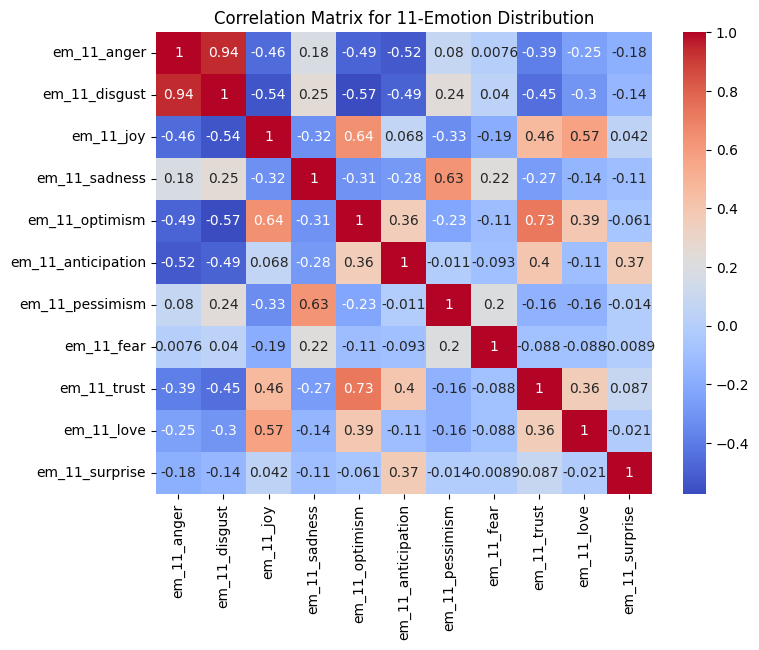

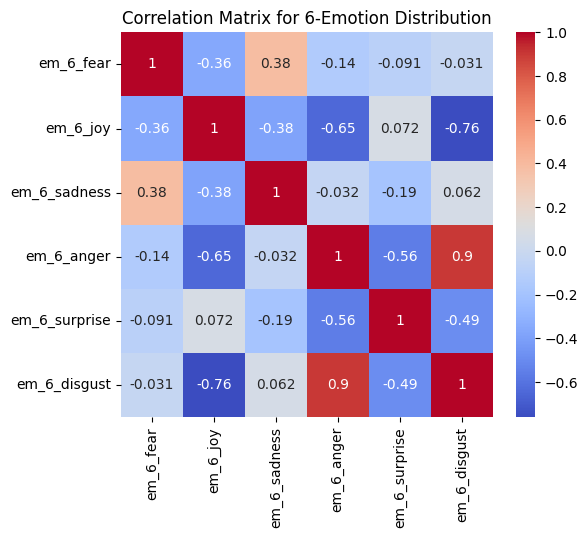

In [53]:
corr_11 = df[[col for col in df.columns if col.startswith("em_11_")]].corr()
corr_6 = df[[col for col in df.columns if col.startswith("em_6_")]].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr_11, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix for 11-Emotion Distribution")
plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(corr_6, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix for 6-Emotion Distribution")
plt.show()

In [130]:
replies_df = pd.read_csv('/work/ptyagi/masterthesis/data/predictions/aug/predictions_replies_cardiffnlp_twitter-roberta-large-emotion-latest_merged.csv')
tweets_df = pd.read_csv("/work/ptyagi/masterthesis/data/predictions/aug/averaged_predictions.csv")

def parse_distribution(dist_str):
    return dict(ast.literal_eval(dist_str))

replies_df['label_distribution'] = replies_df['mapped_predictions'].apply(parse_distribution)
tweets_df['tweet_distribution'] = tweets_df['mapped_predictions'].apply(parse_distribution)
tweets_df['average_reply_distribution'] = tweets_df['averaged_predictions'].apply(parse_distribution)
tweets_df['clip_distribution'] = tweets_df['clip_predictions'].apply(parse_distribution)

In [131]:
def average_distributions(row):
    dist_1 = row['tweet_distribution']
    dist_2 = row['clip_distribution']
    avg_dist = {key: (dist_1[key] + dist_2[key]) / 2 for key in dist_1}
    return avg_dist
tweets_df['clip_tweet_dist'] = tweets_df.apply(average_distributions, axis=1)

In [132]:
from sklearn.metrics.pairwise import cosine_similarity

def calculate_cosine_similarity_with_custom_name(df, col_pairs_with_names):
    for col1, col2, similarity_col in col_pairs_with_names:

        df[f'{col1}_list'] = df[col1].apply(lambda x: list(x.values()) if isinstance(x, dict) else x)
        df[f'{col2}_list'] = df[col2].apply(lambda x: list(x.values()) if isinstance(x, dict) else x)
        
        df[similarity_col] = df.apply(
            lambda row: cosine_similarity([row[f'{col1}_list']], [row[f'{col2}_list']])[0][0],
            axis=1
        )
    
    df.drop(columns=[f'{col}_list' for col1, col2, _ in col_pairs_with_names for col in [col1, col2]], inplace=True)
    
    return df

df = tweets_df.copy()

column_pairs_with_names = [('tweet_distribution', 'average_reply_distribution', 'cosine_similarity_tweet_replies'),
                        ('clip_distribution', 'average_reply_distribution', 'cosine_similarity_clip_replies'),
                        ('tweet_distribution', 'clip_distribution', 'cosine_similarity_clip_tweet'),
                        ('clip_tweet_dist', 'average_reply_distribution', 'cosine_similarity_multi')]

result_df = calculate_cosine_similarity_with_custom_name(df, column_pairs_with_names)



In [133]:
tweets_df = result_df.copy()

In [134]:
from scipy.spatial.distance import jensenshannon

categories = ['anger', 'surprise', 'disgust', 'sadness', 'fear', 'joy']

def compute_jsd(tweet_dist, reply_dist):
    tweet_probs = [tweet_dist[cat] for cat in categories]
    reply_probs = [reply_dist[cat] for cat in categories]

    return jensenshannon(tweet_probs, reply_probs, base=2)


In [135]:
tweets_df['jsd'] = tweets_df.apply(lambda row: compute_jsd(row['tweet_distribution'], row['average_reply_distribution']), axis=1)
tweets_df['jsd_image'] = tweets_df.apply(lambda row: compute_jsd(row['tweet_distribution'], row['clip_distribution']), axis=1)
tweets_df['jsd_multi'] = tweets_df.apply(lambda row: compute_jsd(row['clip_tweet_dist'], row['average_reply_distribution']), axis=1)

In [136]:
tweets_df['jsd_image_reply'] = tweets_df.apply(lambda row: compute_jsd(row['clip_distribution'], row['average_reply_distribution']), axis=1)

In [137]:
from scipy.stats import entropy

def compute_entropy(dist):
    probs = list(dist.values())
    return entropy(probs, base=2)

tweets_df['tweet_entropy'] = tweets_df['tweet_distribution'].apply(compute_entropy)
tweets_df['reply_entropy'] = tweets_df['average_reply_distribution'].apply(compute_entropy)
tweets_df['multi_entropy'] = tweets_df['clip_tweet_dist'].apply(compute_entropy)


In [121]:
grouped_replies = replies_df.groupby('conversation_id')


In [122]:
from itertools import combinations
import numpy as np

def pairwise_jsd(distributions):
    # Compute all pairwise JSD between distributions
    jsd_values = []
    for dist1, dist2 in combinations(distributions, 2):
        jsd = jensenshannon(list(dist1.values()), list(dist2.values()), base=2)
        jsd_values.append(jsd)
    return jsd_values

# Calculate pairwise JSD for replies of each tweet
reply_divergence = {}

for tweet_id, group in grouped_replies:
    reply_distributions = group['label_distribution'].tolist()
    jsd_values = pairwise_jsd(reply_distributions)
    reply_divergence[tweet_id] = {
        "mean_jsd": np.mean(jsd_values) if jsd_values else 0,
        "max_jsd": max(jsd_values) if jsd_values else 0,
        "pairwise_jsd": jsd_values
    }

# Convert to DataFrame for easier analysis
divergence_df = pd.DataFrame.from_dict(reply_divergence, orient='index')
divergence_df.reset_index(inplace=True)
divergence_df.rename(columns={"index": "conversation_id"}, inplace=True)


In [ ]:
from itertools import combinations
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

def pairwise_cosine_similarity(distributions):
    # Compute all pairwise cosine similarities between distributions
    cosine_values = []
    for dist1, dist2 in combinations(distributions, 2):
        # Convert distributions to arrays
        dist1_array = np.array(list(dist1.values()))
        dist2_array = np.array(list(dist2.values()))
        # Calculate cosine similarity
        similarity = cosine_similarity([dist1_array], [dist2_array])[0, 0]
        cosine_values.append(similarity)
    return cosine_values

# Calculate pairwise cosine similarity for replies of each tweet
reply_similarity = {}

for tweet_id, group in grouped_replies:
    reply_distributions = group['label_distribution'].tolist()
    cosine_values = pairwise_cosine_similarity(reply_distributions)
    reply_similarity[tweet_id] = {
        "mean_cosine_similarity": np.mean(cosine_values) if cosine_values else 0,
        "max_cosine_similarity": max(cosine_values) if cosine_values else 0,
        "pairwise_cosine_similarity": cosine_values
    }

# Convert to DataFrame for easier analysis
similarity_df = pd.DataFrame.from_dict(reply_similarity, orient='index')
similarity_df.reset_index(inplace=True)
similarity_df.rename(columns={"index": "conversation_id"}, inplace=True)



In [ ]:
similarity_df.head()

In [124]:
divergence_df.to_csv("/work/ptyagi/masterthesis/data/predictions/aug/divergence.csv", index=False)
tweets_df.to_csv("/work/ptyagi/masterthesis/data/predictions/aug/analysis_metrics.csv", index=False)
similarity_df.to_csv("/work/ptyagi/masterthesis/data/predictions/aug/cosine.csv", index=False)

# Analysis

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import ast
from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv("/work/ptyagi/masterthesis/data/predictions/aug/analysis_metrics.csv")
replies_df = pd.read_csv('/work/ptyagi/masterthesis/data/predictions/aug/predictions_replies_cardiffnlp_twitter-roberta-large-emotion-latest_merged.csv')
divergence_df = pd.read_csv("/work/ptyagi/masterthesis/data/predictions/aug/divergence.csv")
annotated = pd.read_csv("/work/ptyagi/masterthesis/data/tmp/annotations_and_predictions.csv")

In [3]:
data['clip_distribution'] = data['clip_distribution'].apply(ast.literal_eval)
data['average_reply_distribution'] = data['average_reply_distribution'].apply(ast.literal_eval)
data['tweet_distribution'] = data['tweet_distribution'].apply(ast.literal_eval)
data['clip_tweet_dist'] = data['clip_tweet_dist'].apply(ast.literal_eval)

In [4]:
data['average_reply_distribution'] = data['average_reply_distribution'].apply(lambda d: {k: round(v, 8) for k, v in d.items()})
data['tweet_distribution'] = data['tweet_distribution'].apply(lambda d: {k: round(v, 8) for k, v in d.items()})
data['clip_tweet_dist'] = data['clip_tweet_dist'].apply(lambda d: {k: round(v, 8) for k, v in d.items()})

In [12]:
merged = pd.merge(data[['conversation_id', 'tweet_text','matched_filename', 'tweet_distribution', 'average_reply_distribution',
'clip_distribution', 'clip_tweet_dist', 'jsd', 'jsd_image', 'jsd_multi','jsd_image_reply','cosine_similarity_multi']], 
annotated[['manual_label', 'conversation_id', 'replies']], on='conversation_id', how='inner')

In [13]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, accuracy_score
from scipy.stats import entropy

def top_k_accuracy(predictions, true_labels, k):
    correct = 0
    for dist, true_label in zip(predictions, true_labels):
        # Align the distribution to the fixed order
        ordered_dist = [dist[cat] for cat in categories]
        top_k_indices = np.argsort(ordered_dist)[-k:][::-1]  # Indices of the top-k probabilities
        top_k_labels = [categories[i] for i in top_k_indices]
        if true_label in top_k_labels:
            correct += 1
    return correct / len(true_labels)

def evaluate_predictions(predicted_distributions, manual_labels, categories):

    predicted_labels = []
    for dist in predicted_distributions:
        ordered_dist = [dist[cat] for cat in categories]
        predicted_label = categories[np.argmax(ordered_dist)]
        predicted_labels.append(predicted_label)

    accuracy = accuracy_score(manual_labels, predicted_labels)
    precision = precision_score(manual_labels, predicted_labels, labels=categories, average='weighted')
    recall = recall_score(manual_labels, predicted_labels, labels=categories, average='weighted')

    cross_entropy_losses = []
    for dist, true_label in zip(predicted_distributions, manual_labels):
        true_one_hot = np.zeros(len(categories))
        true_one_hot[categories.index(true_label)] = 1
        predicted_probs = [dist[cat] for cat in categories]
        cross_entropy_loss = entropy(true_one_hot, predicted_probs)
        cross_entropy_losses.append(cross_entropy_loss)

    average_cross_entropy_loss = np.mean(cross_entropy_losses)

    top_2_accuracy = top_k_accuracy(predicted_distributions, manual_labels, k=2)
    top_3_accuracy = top_k_accuracy(predicted_distributions, manual_labels, k=3)
    
    print("Predicted Labels:", predicted_labels)
    print("Manual labels:", manual_labels)
    print("Accuracy:", accuracy)
    print("Precision (weighted):", precision)
    print("Recall (weighted):", recall)
    print("Average Cross-Entropy Loss:", average_cross_entropy_loss)
    print("Top-2 Accuracy:", top_2_accuracy)
    print("Top-3 Accuracy:", top_3_accuracy)

    return {
        "predicted_labels": predicted_labels,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "average_cross_entropy_loss": average_cross_entropy_loss,
        "Top-2 Accuracy": top_2_accuracy,
        "Top-3 Accuracy": top_3_accuracy
    }
categories = ['anger', 'surprise', 'disgust', 'sadness', 'fear', 'joy']
manual_labels = merged["manual_label"].to_list()

In [14]:
predicted_distributions = merged["tweet_distribution"].to_list() 
results = evaluate_predictions(predicted_distributions, manual_labels, categories)

Predicted Labels: ['anger', 'joy', 'joy', 'joy', 'joy', 'disgust', 'disgust', 'joy', 'disgust', 'joy', 'joy', 'surprise', 'disgust', 'joy', 'joy', 'joy', 'joy', 'joy', 'anger', 'anger', 'anger', 'joy', 'anger', 'anger', 'fear', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'disgust', 'disgust', 'sadness', 'fear', 'fear', 'fear', 'fear', 'fear', 'joy', 'joy', 'fear', 'joy', 'joy', 'joy', 'sadness', 'disgust', 'joy', 'anger', 'joy', 'fear', 'fear', 'disgust', 'joy', 'joy', 'joy', 'disgust', 'disgust', 'disgust', 'disgust', 'disgust', 'fear', 'surprise', 'surprise', 'anger', 'disgust', 'joy', 'joy', 'surprise', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'anger', 'joy', 'joy', 'joy', 'disgust', 'surprise', 'surprise', 'surprise', 'joy', 'surprise', 'joy', 'joy', 'anger', 'anger', 'fear', 'disgust']
Manual labels: ['joy', 'sadness', 'sadness', 'anger', 'sadness', 'disgust', 'anger', 'joy', 'disgust', 'joy', 'anger', 'disgust', 'anger'

In [15]:
predicted_distributions = merged["clip_distribution"].to_list() 
results = evaluate_predictions(predicted_distributions, manual_labels, categories)

Predicted Labels: ['sadness', 'anger', 'anger', 'disgust', 'anger', 'anger', 'anger', 'anger', 'fear', 'disgust', 'fear', 'fear', 'anger', 'anger', 'surprise', 'fear', 'fear', 'fear', 'anger', 'anger', 'anger', 'anger', 'fear', 'fear', 'anger', 'anger', 'anger', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'anger', 'anger', 'anger', 'disgust', 'disgust', 'disgust', 'disgust', 'disgust', 'fear', 'disgust', 'disgust', 'anger', 'fear', 'anger', 'joy', 'anger', 'anger', 'disgust', 'anger', 'disgust', 'disgust', 'anger', 'anger', 'anger', 'disgust', 'anger', 'anger', 'anger', 'anger', 'anger', 'joy', 'fear', 'anger', 'anger', 'anger', 'fear', 'fear', 'surprise', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'fear', 'anger', 'anger', 'anger', 'fear', 'fear', 'fear', 'fear', 'fear', 'anger', 'anger', 'fear', 'fear', 'disgust', 'disgust']
Manual labels: ['joy', 'sadness', 'sadness', 'anger', 'sadness', 'disgust', 'anger', 'joy

In [16]:
predicted_distributions = merged["clip_tweet_dist"].to_list() 
results = evaluate_predictions(predicted_distributions, manual_labels, categories)

Predicted Labels: ['anger', 'anger', 'joy', 'joy', 'joy', 'anger', 'anger', 'joy', 'fear', 'joy', 'joy', 'surprise', 'anger', 'joy', 'joy', 'joy', 'joy', 'joy', 'anger', 'anger', 'anger', 'joy', 'anger', 'anger', 'fear', 'joy', 'joy', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'fear', 'anger', 'disgust', 'surprise', 'fear', 'fear', 'fear', 'fear', 'fear', 'joy', 'joy', 'disgust', 'joy', 'joy', 'anger', 'joy', 'anger', 'joy', 'disgust', 'joy', 'fear', 'fear', 'anger', 'joy', 'anger', 'joy', 'anger', 'anger', 'anger', 'anger', 'anger', 'fear', 'fear', 'surprise', 'anger', 'anger', 'joy', 'joy', 'surprise', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'joy', 'joy', 'joy', 'anger', 'surprise', 'surprise', 'surprise', 'fear', 'fear', 'joy', 'joy', 'anger', 'anger', 'disgust', 'disgust']
Manual labels: ['joy', 'sadness', 'sadness', 'anger', 'sadness', 'disgust', 'anger', 'joy', 'disgust', 'joy', 'anger', 'disgust', 'anger', 'surp

/home/ptyagi/miniconda3/envs/thesis_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [5]:
train_data, temp_data = train_test_split(data, test_size=0.3, random_state=42)
val_data, tweets_df = train_test_split(temp_data, test_size=1/3, random_state=42)

In [23]:
def parse_distribution(dist_str):
    return dict(ast.literal_eval(dist_str))

In [24]:
tweets_df['roberta_pred_dist'] = tweets_df['roberta-large-predictions'].apply(parse_distribution)

In [27]:
tweets_df['roberta_pred_dist'].iloc[1]

{'disgust': 0.9435292482376099,
 'anger': 0.9172366261482239,
 'optimism': 0.34833213686943054,
 'anticipation': 0.23339901864528656,
 'pessimism': 0.14290618896484375,
 'sadness': 0.07100561261177063,
 'trust': 0.027429115027189255,
 'surprise': 0.022931357845664024,
 'joy': 0.022258438169956207,
 'fear': 0.016862407326698303,
 'love': 0.003642430528998375}

In [7]:
df = pd.read_csv("/work/ptyagi/masterthesis/data/test_predictions_with_cosine.csv")
df['predictions_dict'] = df['predictions'].apply(parse_distribution)

In [8]:
tweets_df = pd.merge(tweets_df, df, on='conversation_id', how='inner')

In [9]:
tweets_df['predictions_dict'] = tweets_df['predictions_dict'].apply(lambda d: {k: round(v, 8) for k, v in d.items()})

In [10]:
from scipy.spatial.distance import jensenshannon

categories = ['anger', 'surprise', 'disgust', 'sadness', 'fear', 'joy']

def compute_jsd(tweet_dist, reply_dist):
    tweet_probs = [tweet_dist[cat] for cat in categories]
    reply_probs = [reply_dist[cat] for cat in categories]

    return jensenshannon(tweet_probs, reply_probs, base=2)

In [11]:
tweets_df['jsd_model'] = tweets_df.apply(lambda row: compute_jsd(row['predictions_dict'], row['average_reply_distribution']), axis=1)

In [12]:
tweets_df["cosine_similarity_tweet_replies"].mean()

0.6919531516105084

In [13]:
tweets_df["cosine_similarity_clip_replies"].mean()

0.5017263212570279

In [14]:
tweets_df['cosine_similarity_clip_tweet'].mean()

0.4739913947314479

In [15]:
tweets_df['cosine_similarity_multi'].mean()

0.709041413816695

In [16]:
tweets_df['cosine_similarity_model'].mean()

0.8297699966938775

In [17]:
tweets_df["jsd"].mean()

0.42320238987621633

In [18]:
tweets_df["jsd_multi"].mean()

0.4173777087291233

In [19]:
tweets_df["jsd_model"].mean()

0.43987058605453094

In [30]:
def reorder_dict(d, order):
    return {key: d[key] for key in order if key in d}

tweets_df['predictions_dict'] = tweets_df['predictions_dict'].apply(lambda x: reorder_dict(x, ['anger', 'fear', 'surprise', 'disgust', 'sadness', 'joy' ]))


In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

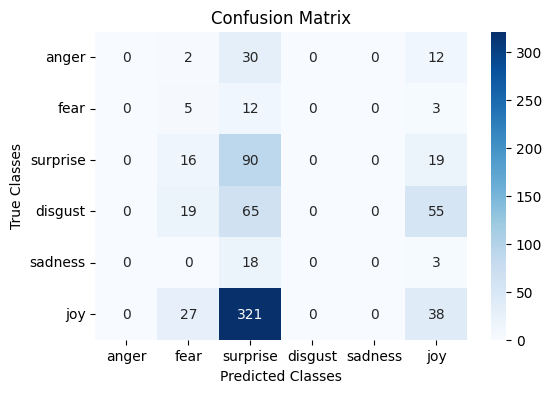

In [34]:
def argmax_class(d):
    return max(d, key=d.get)

teacher_classes = tweets_df['average_reply_distribution'].apply(argmax_class)
student_classes = tweets_df['predictions_dict'].apply(argmax_class)

labels = ['anger', 'fear', 'surprise', 'disgust', 'sadness', 'joy']

cm = confusion_matrix(teacher_classes, student_classes, labels=labels)

cm_df = pd.DataFrame(cm, index=labels, columns=labels)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)

plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.title('Confusion Matrix')
plt.show()



In [36]:
print(classification_report(
    teacher_classes, 
    student_classes, 
    labels=labels, 
    target_names=labels
))

              precision    recall  f1-score   support

       anger       0.00      0.00      0.00        44
        fear       0.07      0.25      0.11        20
    surprise       0.17      0.72      0.27       125
     disgust       0.00      0.00      0.00       139
     sadness       0.00      0.00      0.00        21
         joy       0.29      0.10      0.15       386

    accuracy                           0.18       735
   macro avg       0.09      0.18      0.09       735
weighted avg       0.18      0.18      0.13       735



/home/ptyagi/miniconda3/envs/thesis_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ptyagi/miniconda3/envs/thesis_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ptyagi/miniconda3/envs/thesis_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{m

In [ ]:
emotion_mapping = {
    "anger": "anger",
    "anticipation": "surprise", 
    "disgust": "disgust",
    "fear": "fear",
    "joy": "joy",
    "love": "joy",           
    "optimism": "joy",       
    "pessimism": "fear",     
    "sadness": "sadness",
    "surprise": "surprise",
    "trust": "joy"           
}

In [189]:
def visualize_tweets(data, start_idx=0, end_idx=8, rows=2, cols=4):
    """
    Visualizes tweets and images for a specified index range.
    
    Parameters:
        data: DataFrame containing tweet information
        start_idx: Starting index of the range
        end_idx: Ending index of the range (exclusive)
        rows: Number of rows in the plot grid
        cols: Number of columns in the plot grid
    """
    batch_data = data.iloc[start_idx:end_idx]

    if batch_data.empty:
        print("No tweets found in the specified index range.")
        return

    # Create a figure with subplots
    fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
    axes = axes.flatten()  # Flatten for easy indexing

    categories = ['anger', 'fear', 'surprise', 'disgust', 'sadness', 'joy' ]
    
    for i, (index, row) in enumerate(batch_data.iterrows()):
        print(row['conversation_id']) 
        # Get tweet details
        tweet_text = row["tweet_text"]
        tweet_distribution = row["tweet_distribution"]
        clip_distribution = row["clip_distribution"]
        ordered_dict = {key: clip_distribution[key] for key in categories}
        multi_distribution = row["clip_tweet_dist"]
        ordered_dict_0 = {key: multi_distribution[key] for key in categories}
        predicted_dist = row["predictions_dict"]
        ordered_dict_1 = {key: predicted_dist[key] for key in categories}
        avg_dist = row["average_reply_distribution"]
        image_path = f'/work/ptyagi/ClimateVisions/Images/2019/08_August/{row["matched_filename"]}'

        try:
            image = Image.open(image_path)
            axes[i].imshow(image)
            axes[i].axis('off')
            axes[i].set_title(f"Tweet ID: {row['conversation_id']}", fontsize=8)
        except FileNotFoundError:
            print(f"Image not found for conversation_id: {row['conversation_id']}")
            axes[i].axis('off')
            axes[i].set_title("Image Not Found", fontsize=8)

        # Print details in console for analysis
        print(f"Tweet {i + 1}: {tweet_text}")
        print(f"Tweet Distribution: {tweet_distribution}")
        print(f"CLIP Distribution: {ordered_dict}")
        print(f"Average Distribution: {ordered_dict_0}")
        print(f"Predicted Distribution: {ordered_dict_1}")
        print(f"reply Distribution: {avg_dist}")
        print(f"JSD tweet: {row['jsd']}")
        print(f"JSD model: {row['jsd_model']}")
        print("-" * 50)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Explicitly close the figure to release resources



In [191]:
high_jsd_replies = divergence_df[divergence_df['mean_jsd'] > 0.7]
low_jsd_replies = divergence_df[(divergence_df['mean_jsd'] < 0.3) & (divergence_df['mean_jsd'] > 0.01)]

In [192]:
high_jsd_replies_df = replies_df[replies_df['conversation_id'].isin(high_jsd_replies['conversation_id'])]
high_jsd_replies_df.reset_index(drop=True, inplace=True)
low_jsd_replies_df = replies_df[replies_df['conversation_id'].isin(low_jsd_replies['conversation_id'])]
low_jsd_replies_df.reset_index(drop=True, inplace=True)

In [193]:
high = tweets_df[tweets_df['conversation_id'].isin(high_jsd_replies_df['conversation_id'])]
low = tweets_df[tweets_df['conversation_id'].isin(low_jsd_replies_df['conversation_id'])]
low.reset_index(drop=True, inplace=True)
high.reset_index(drop=True, inplace=True)

In [194]:
(len(high)/len(tweets_df))*100

2.857142857142857

In [195]:
(len(low)/len(tweets_df))*100

8.027210884353742

1158024573243334657
Tweet 1: Sage words from co-founder of the [USER] [USER] [USER] [USER] and others, and why the ridiculous Greta-bashing NYT Op yesterday was so out of touch. Democracy hasn't \caught up\" to #climatechange yet, so time to wake it up[USER] [USER] [URL]
Tweet Distribution: {'anger': 0.33359729, 'fear': 0.05810755, 'surprise': 0.09322689, 'disgust': 0.34315987, 'sadness': 0.02582461, 'joy': 0.14608378}
CLIP Distribution: {'anger': 0.17898792, 'fear': 0.18953924, 'surprise': 0.3979619, 'disgust': 0.1926324, 'sadness': 0.031854156, 'joy': 0.009024405}
Average Distribution: {'anger': 0.25629261, 'fear': 0.12382339, 'surprise': 0.2455944, 'disgust': 0.26789614, 'sadness': 0.02883938, 'joy': 0.07755409}
Predicted Distribution: {'anger': 0.17020798, 'fear': 0.20318863, 'surprise': 0.25271457, 'disgust': 0.08185319, 'sadness': 0.07425234, 'joy': 0.21778329}
reply Distribution: {'anger': 0.12345012, 'fear': 0.11854714, 'surprise': 0.20602181, 'disgust': 0.15895952, 'sadness': 

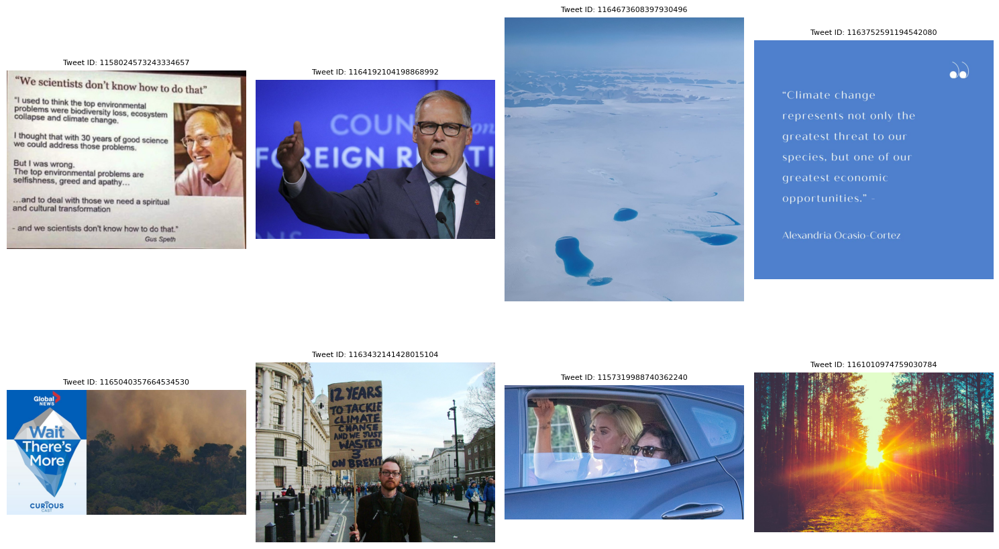

In [196]:
visualize_tweets(high, start_idx=0, end_idx=8)

# Cosine Sim

In [197]:
good = tweets_df[(tweets_df['cosine_similarity_tweet_replies'] < 0.4) & (tweets_df['cosine_similarity_model'] > 0.8)]
good.reset_index(drop=True, inplace=True)

1159487067505790985
Tweet 1: That darn dust-bowl, man-made climate change thingy...[URL] [URL]
Tweet Distribution: {'anger': 0.42240623, 'fear': 0.04012297, 'surprise': 0.01480248, 'disgust': 0.43272685, 'sadness': 0.06963292, 'joy': 0.02030856}
CLIP Distribution: {'anger': 0.31396592, 'fear': 0.507273, 'surprise': 0.07475132, 'disgust': 0.068387166, 'sadness': 0.033587635, 'joy': 0.002034858}
Average Distribution: {'anger': 0.36818607, 'fear': 0.27369798, 'surprise': 0.0447769, 'disgust': 0.25055701, 'sadness': 0.05161028, 'joy': 0.01117171}
Predicted Distribution: {'anger': 0.18836187, 'fear': 0.17330769, 'surprise': 0.21402618, 'disgust': 0.09172715, 'sadness': 0.07106127, 'joy': 0.26151583}
reply Distribution: {'anger': 0.0541517, 'fear': 0.11927994, 'surprise': 0.18276132, 'disgust': 0.08563974, 'sadness': 0.18352689, 'joy': 0.37464041}
JSD tweet: 0.6653766442044553
JSD model: 0.242463237793993
--------------------------------------------------
1165899974472683520
Tweet 2: “I thin

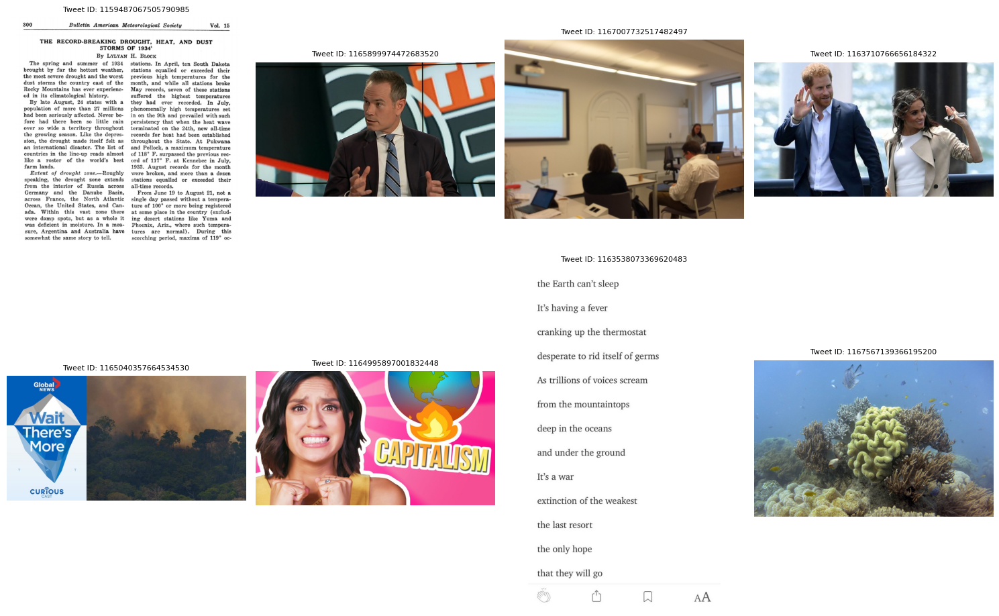

In [198]:
visualize_tweets(good)

In [199]:
low_jsd = tweets_df[tweets_df['jsd_model'] < 0.4]
low_jsd.reset_index(drop=True, inplace=True)

1158024573243334657
Tweet 1: Sage words from co-founder of the [USER] [USER] [USER] [USER] and others, and why the ridiculous Greta-bashing NYT Op yesterday was so out of touch. Democracy hasn't \caught up\" to #climatechange yet, so time to wake it up[USER] [USER] [URL]
Tweet Distribution: {'anger': 0.33359729, 'fear': 0.05810755, 'surprise': 0.09322689, 'disgust': 0.34315987, 'sadness': 0.02582461, 'joy': 0.14608378}
CLIP Distribution: {'anger': 0.17898792, 'fear': 0.18953924, 'surprise': 0.3979619, 'disgust': 0.1926324, 'sadness': 0.031854156, 'joy': 0.009024405}
Average Distribution: {'anger': 0.25629261, 'fear': 0.12382339, 'surprise': 0.2455944, 'disgust': 0.26789614, 'sadness': 0.02883938, 'joy': 0.07755409}
Predicted Distribution: {'anger': 0.17020798, 'fear': 0.20318863, 'surprise': 0.25271457, 'disgust': 0.08185319, 'sadness': 0.07425234, 'joy': 0.21778329}
reply Distribution: {'anger': 0.12345012, 'fear': 0.11854714, 'surprise': 0.20602181, 'disgust': 0.15895952, 'sadness': 

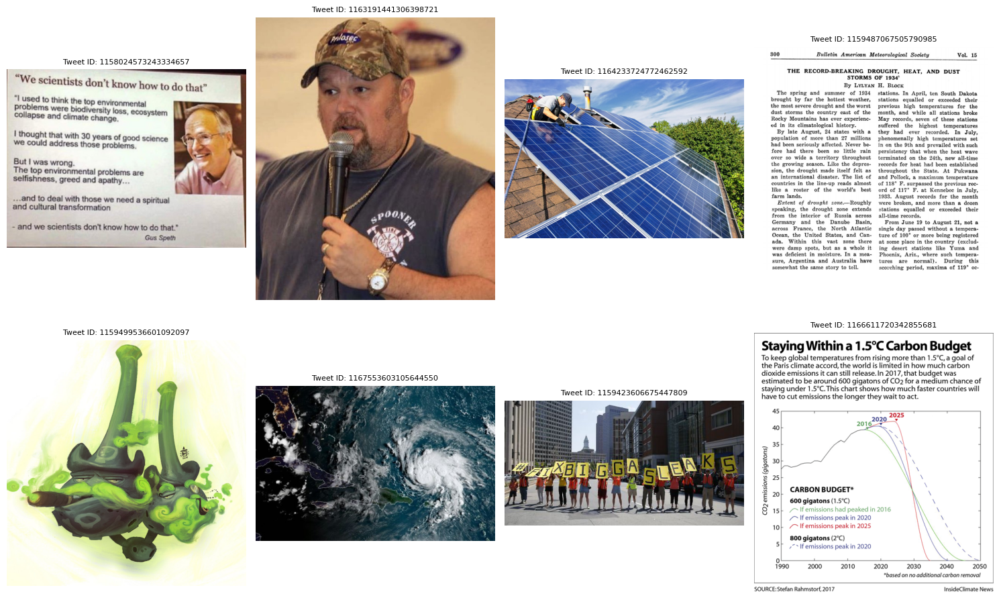

In [200]:
visualize_tweets(low_jsd)

In [201]:
high_jsd = tweets_df[tweets_df['jsd_model'] > 0.8]
high_jsd.reset_index(drop=True, inplace=True)

1163752659255472128
Tweet 1: The #Aerobiology Group at UNIKA-T: European excellence and leading research [URL] [USER] [USER] #Aeroallergen #Allergy #ClimateChange UNIKA-T Student becomes best performing EAS [URL] participant in pollen and spore identification [URL]
Tweet Distribution: {'anger': 0.00355936, 'fear': 0.00446954, 'surprise': 0.19746485, 'disgust': 0.00926397, 'sadness': 0.01331477, 'joy': 0.77192751}
CLIP Distribution: {'anger': 0.37730277, 'fear': 0.16062412, 'surprise': 0.1169638, 'disgust': 0.21240209, 'sadness': 0.11411874, 'joy': 0.01858845}
Average Distribution: {'anger': 0.19043106, 'fear': 0.08254683, 'surprise': 0.15721433, 'disgust': 0.11083303, 'sadness': 0.06371676, 'joy': 0.39525798}
Predicted Distribution: {'anger': 0.04622085, 'fear': 0.23150012, 'surprise': 0.55552489, 'disgust': 0.05999175, 'sadness': 0.04753936, 'joy': 0.059223}
reply Distribution: {'anger': 0.00192183, 'fear': 0.00564771, 'surprise': 0.03242159, 'disgust': 0.00339114, 'sadness': 0.005335

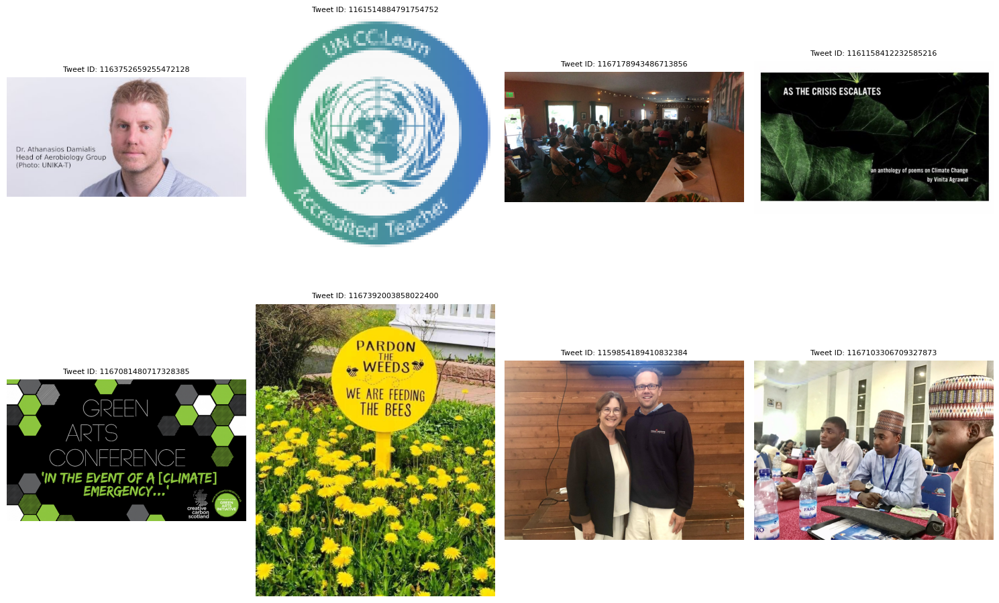

In [204]:
visualize_tweets(high_jsd)

In [ ]:
# with high divergence between tweet text and replies
high_jsd_tweets = tweets_df.sort_values(by='jsd', ascending=False)
high_jsd_tweets.reset_index(drop=True, inplace=True)

In [ ]:
# with high divergence between tweet text and clip
high_jsd_images_text=tweets_df.sort_values(by='jsd_image', ascending=False)
high_jsd_images_text.reset_index(drop=True, inplace=True)

In [35]:
filtered_df = tweets_df[
    tweets_df["clip_distribution"].apply(lambda x: max(x, key=x.get) == "anger") &
    tweets_df["tweet_distribution"].apply(lambda x: max(x, key=x.get) == "joy")
]

filtered_df['abs_diff'] = filtered_df.apply(lambda row: row['clip_distribution']['anger'] + row['tweet_distribution']['joy'], axis=1)

sorted_df = filtered_df.sort_values(by='abs_diff', ascending=False)
sorted_df.reset_index(drop=True, inplace=True)

/tmp/ipykernel_567622/1050350475.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['abs_diff'] = filtered_df.apply(lambda row: row['clip_distribution']['anger'] + row['tweet_distribution']['joy'], axis=1)


1100723112314843136
Tweet 1: #butterfly #smalltortoiseshell beautiful - but it’s a bit early mate! #climatechange #GlobalWarming [URL]
Tweet Distribution: {'fear': 0.02914309, 'disgust': 0.01307049, 'joy': 0.86895257, 'surprise': 0.05505749, 'sadness': 0.02610704, 'anger': 0.00766932}
CLIP Distribution: {'fear': 0.032711677, 'disgust': 0.12930873, 'joy': 0.0053000045, 'surprise': 0.041601103, 'sadness': 0.024338923, 'anger': 0.7667396}
reply Distribution: {'fear': 0.0277952, 'disgust': 0.005279, 'joy': 0.4771594, 'surprise': 0.054186, 'sadness': 0.4334062, 'anger': 0.0021742}
--------------------------------------------------
1098851263553437696
Tweet 2: Girls are also leading on mitigating #ClimateChange Join the #girls movement #Recycling girl #GreenKidsAwards ceremony. Our 🌏 our business #MyLittleHandsBigImpact #environment [URL]
Tweet Distribution: {'fear': 0.01072476, 'disgust': 0.00322281, 'joy': 0.84276676, 'surprise': 0.13417914, 'sadness': 0.00756696, 'anger': 0.00153957}
CLIP

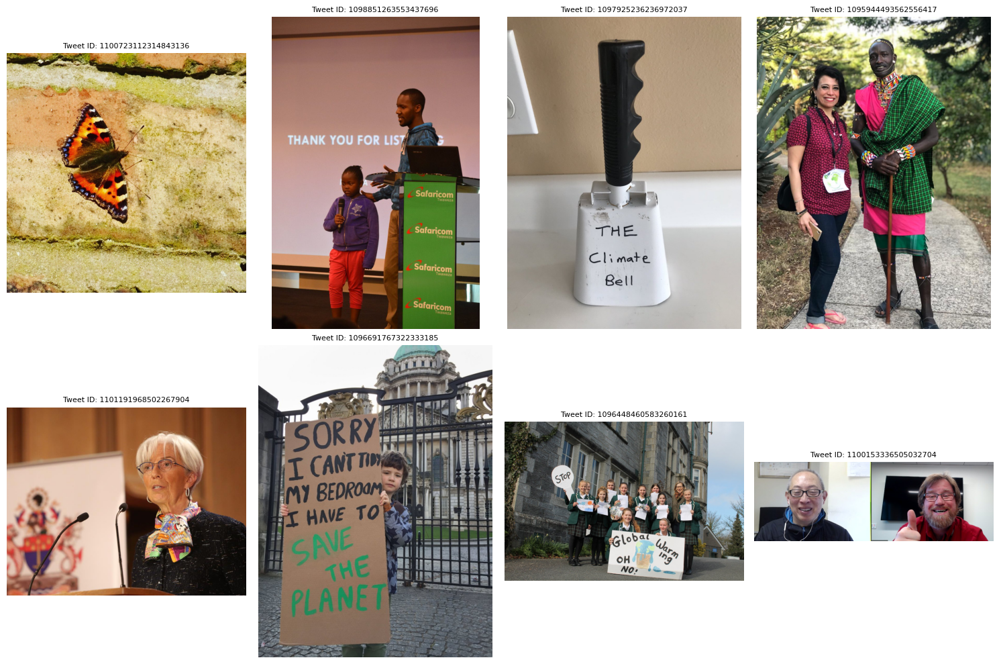

In [36]:
visualize_tweets(sorted_df, start_idx=0, end_idx=8)

In [37]:
# with high divergence between replies and clip
high_jsd_images = tweets_df.sort_values(by='jsd_image_reply', ascending=False)
high_jsd_images.reset_index(drop=True, inplace=True)

1098851263553437696
Tweet 1: Girls are also leading on mitigating #ClimateChange Join the #girls movement #Recycling girl #GreenKidsAwards ceremony. Our 🌏 our business #MyLittleHandsBigImpact #environment [URL]
Tweet Distribution: {'fear': 0.01072476, 'disgust': 0.00322281, 'joy': 0.84276676, 'surprise': 0.13417914, 'sadness': 0.00756696, 'anger': 0.00153957}
CLIP Distribution: {'fear': 0.08244331, 'disgust': 0.09047955, 'joy': 0.010988973, 'surprise': 0.09584811, 'sadness': 0.056689434, 'anger': 0.66355056}
reply Distribution: {'fear': 0.0071747, 'disgust': 0.0021503, 'joy': 0.7442691, 'surprise': 0.2413507, 'sadness': 0.0028449, 'anger': 0.0022103}
--------------------------------------------------
1100153336505032704
Tweet 2: A great video chat meeting here on #MotivationMonday with [USER] of [USER] as we talked about the value of social media connectedness for #teachers working on issues like #climatechange and #evolution! Thanks for your time Paul! #SupportScience #SupportEachOthe

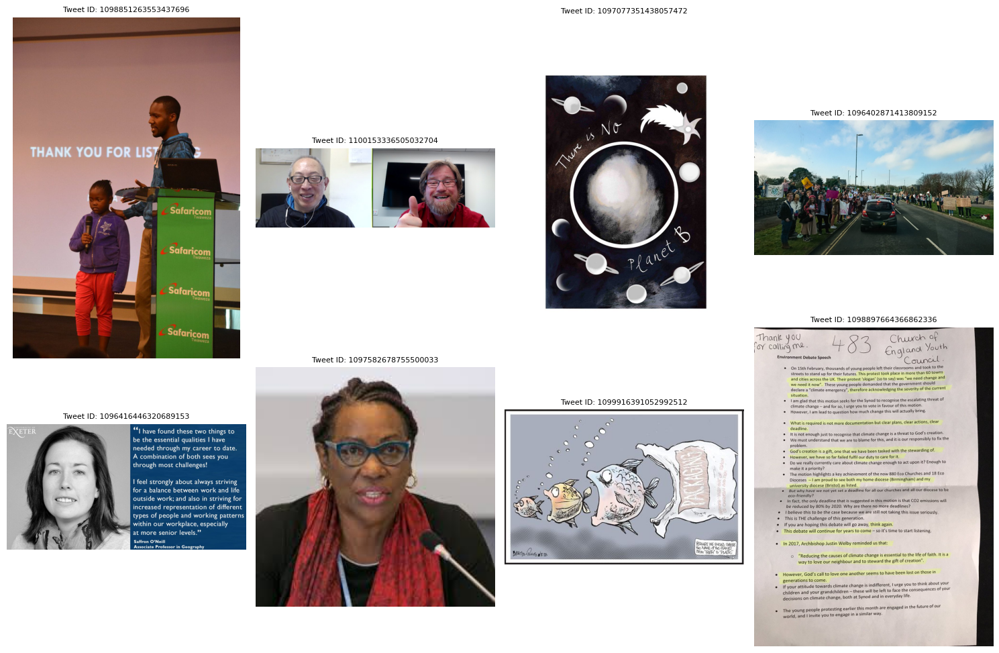

In [41]:
visualize_tweets(high_jsd_images, start_idx=8, end_idx=16)

In [42]:
low_jsd_images = tweets_df.sort_values(by='jsd_image_reply')
low_jsd_images.reset_index(drop=True, inplace=True)

1096394482763718656
Tweet 1: #ClimateChange: young people striking from school see it for the life-threatening issue it is [URL] [USER] #kudos #schoolstrike4climate [URL]
Tweet Distribution: {'fear': 0.20128127, 'disgust': 0.07343608, 'joy': 0.32066771, 'surprise': 0.15113254, 'sadness': 0.14377483, 'anger': 0.10970757}
CLIP Distribution: {'fear': 0.15692787, 'disgust': 0.2695154, 'joy': 0.025126064, 'surprise': 0.11264952, 'sadness': 0.26441818, 'anger': 0.17136294}
reply Distribution: {'fear': 0.2675076, 'disgust': 0.1938493, 'joy': 0.0559054, 'surprise': 0.2057412, 'sadness': 0.1455307, 'anger': 0.1314659}
--------------------------------------------------
1097480795931983872
Tweet 2: #ClimateChange.... circa 1980 I'm guessing this is worth a whole lot of Farting Cows! What do you think? [URL]
Tweet Distribution: {'fear': 0.03578565, 'disgust': 0.28147926, 'joy': 0.11586194, 'surprise': 0.34190097, 'sadness': 0.01863538, 'anger': 0.20633679}
CLIP Distribution: {'fear': 0.12824665, '

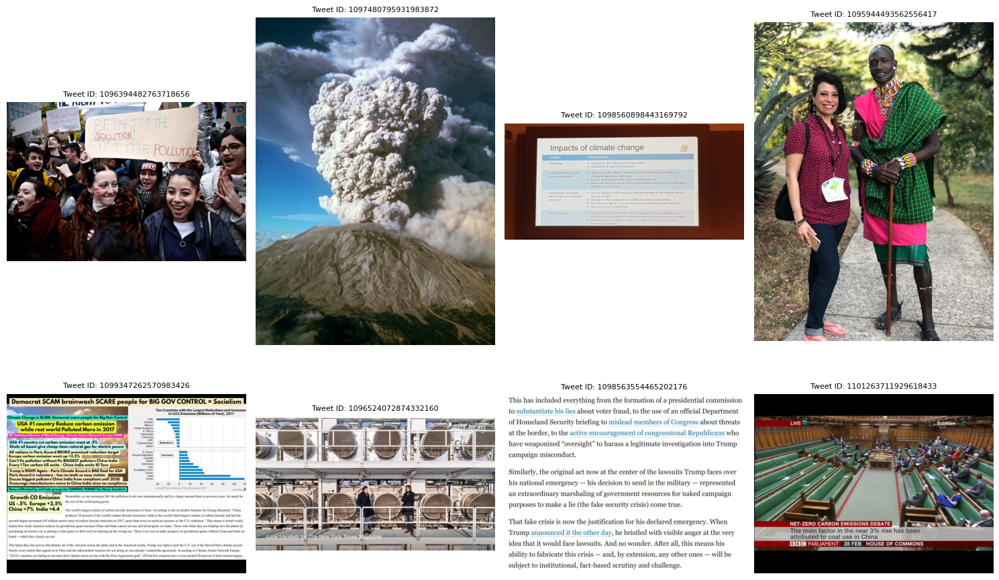

In [44]:
visualize_tweets(low_jsd_images, start_idx=8, end_idx=16)

In [46]:
# with high divergence between replies and combined clip and text
high_jsd_combined = tweets_df.sort_values(by='jsd_multi', ascending=False)
high_jsd_combined.reset_index(drop=True, inplace=True)

In [47]:
high_jsd_combined.head(3)

,conversation_id,tweet_text,roberta-large-predictions,mapped_predictions,averaged_predictions,cosine_similarity_tweet_replies,clip_predictions,cosine_similarity_clip_replies,cosine_similarity_clip_tweet,matched_filename,...,clip_distribution,clip_tweet_dist,jsd,jsd_image,jsd_multi,jsd_image_reply,tweet_entropy,reply_entropy,multi_entropy,cosine_similarity_multi
0,1096508220921835525,Thousands of UK students skip school for clima...,"[('sadness', 0.9059814214706421), ('disgust', ...","[('fear', 0.28478632670826576), ('disgust', 0....","[('fear', 0.004097973576324537), ('disgust', 0...",0.021592,"[('fear', 0.43530864), ('anger', 0.2611676), (...",0.064699,0.795165,id_1096508220921835525_2019-02-15.jpg,...,"{'fear': 0.43530864, 'anger': 0.2611676, 'disg...","{'fear': 0.3600474833541329, 'disgust': 0.1965...",0.939652,0.446768,0.915209,0.746285,2.129236,0.410273,2.209578,0.046472
1,1100699069037625344,Why are big businesses (like Shell and BP) sti...,"[('anger', 0.9166171550750732), ('disgust', 0....","[('fear', 0.019803260987205445), ('disgust', 0...","[('fear', 0.004421200694411544), ('disgust', 0...",0.060846,"[('disgust', 0.41582605), ('anger', 0.3924651)...",0.036512,0.975574,id_1100699069037625344_2019-02-27.jpg,...,"{'disgust': 0.41582605, 'anger': 0.3924651, 'f...","{'fear': 0.06413614049360272, 'disgust': 0.403...",0.878562,0.632307,0.890761,0.786799,1.870696,0.860681,1.880442,0.048838
2,1097486758265188352,"#NowReading | Worldwide, 20.8 million tons of ...","[('sadness', 0.893392026424408), ('fear', 0.85...","[('fear', 0.42692690867730654), ('disgust', 0....","[('fear', 0.006388390008331149), ('disgust', 0...",0.090228,"[('anger', 0.8127797), ('surprise', 0.06904385...",0.025264,0.123060,id_1097486758265188352_2019-02-18.jpg,...,"{'anger': 0.8127797, 'surprise': 0.06904385, '...","{'fear': 0.23105644333865327, 'disgust': 0.067...",0.866535,0.432019,0.886685,0.861399,1.921801,0.772624,2.105776,0.068549


In [28]:
tweets_df[(tweets_df['jsd'] > 0.7) & (tweets_df['jsd_image_reply'] < 0.3)]

,conversation_id,tweet_text,roberta-large-predictions,mapped_predictions,averaged_predictions,cosine_similarity_tweet_replies,clip_predictions,cosine_similarity_clip_replies,cosine_similarity_clip_tweet,matched_filename,...,clip_distribution,clip_tweet_dist,jsd,jsd_image,jsd_multi,jsd_image_reply,tweet_entropy,reply_entropy,multi_entropy,cosine_similarity_multi
394,1096398745745408000,“There can be no sustainable econ growth w/o w...,"[('optimism', 0.9866390228271484), ('anticipat...","[('fear', 0.018522344818810377), ('disgust', 0...","[('fear', 0.2996671284860745), ('disgust', 0.2...",0.166844,"[('surprise', 0.25219026), ('anger', 0.2123019...",0.758185,0.365405,id_1096398745745408000_2019-02-15.jpg,...,"{'surprise': 0.25219026, 'anger': 0.21230192, ...","{'fear': 0.06906215490940519, 'disgust': 0.101...",0.814400,0.605127,0.528802,0.288076,1.086886,2.288316,2.261335,0.454280
1656,1101068465039949824,"4/4 [USER]: \The new, safer nuclear reactors t...","[('anticipation', 0.9034678936004639), ('optim...","[('fear', 0.02539539411730543), ('disgust', 0....","[('fear', 0.39704822097077075), ('disgust', 0....",0.252243,"[('anger', 0.4915793), ('disgust', 0.17426959)...",0.670733,0.164711,id_1101068465039949824_2019-02-28.jpg,...,"{'anger': 0.4915793, 'disgust': 0.17426959, 'f...","{'fear': 0.07969250705865272, 'disgust': 0.091...",0.753114,0.688208,0.468709,0.292057,1.259757,2.125241,2.308428,0.571961


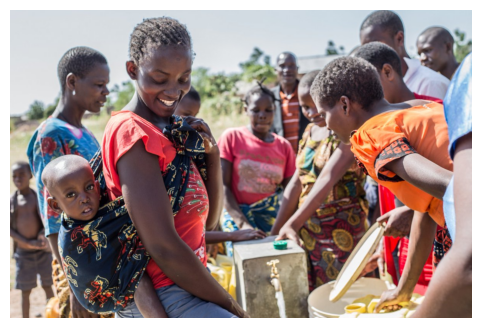

“There can be no sustainable econ growth w/o women’s empowerment, and there can be no women’s #empowerment w/o access to comprehensive #reproductivehealth services, including #familyplanning” – [USER] [URL] #Africa #Tanzania #InterestingReads #ChoiceQuotes [URL]
{'fear': 0.018522344818810377, 'disgust': 0.008249982463429, 'joy': 0.719094994940242, 'surprise': 0.24263078322005346, 'sadness': 0.006730773222672264, 'anger': 0.004771121334792866}
{'surprise': 0.25219026, 'anger': 0.21230192, 'disgust': 0.19461864, 'sadness': 0.14719376, 'fear': 0.119601965, 'joy': 0.0740934}
{'fear': 0.2996671284860745, 'disgust': 0.21790947263908647, 'joy': 0.059766776786421665, 'surprise': 0.03154243090649841, 'sadness': 0.26149301062093444, 'anger': 0.1296211805609845}


In [29]:
path = "/work/ptyagi/ClimateVisions/Images/2019/02_February/id_1096398745745408000_2019-02-15.jpg"
image = Image.open(path)

# Set the figure size
plt.figure(figsize=(6, 4)) 
plt.imshow(image)
plt.axis('off')  # Remove axes for better visualization
plt.show()
print(tweets_df[(tweets_df['jsd'] > 0.7) & (tweets_df['jsd_image_reply'] < 0.3)]['tweet_text'].iloc[0])
print(tweets_df[(tweets_df['jsd'] > 0.7) & (tweets_df['jsd_image_reply'] < 0.3)]['tweet_distribution'].iloc[0])
print(tweets_df[(tweets_df['jsd'] > 0.7) & (tweets_df['jsd_image_reply'] < 0.3)]['clip_distribution'].iloc[0])
print(tweets_df[(tweets_df['jsd'] > 0.7) & (tweets_df['jsd_image_reply'] < 0.3)]['average_reply_distribution'].iloc[0])

In [35]:
high_jsd_replies_df.head()

,id,conversation_id,created_at,replies,tweet_text,tweet_lang,lang_confidence,roberta-large-predictions,mapped_predictions
0,1095930646671835136,1095926032505425921,2019-02-14 06:20:02+00:00,Nailed it!!,WEATHER UPDATESource: AccuWeather[URL] [URL],en,0.458873,"[('joy', 0.957831859588623), ('optimism', 0.84...","[('fear', 0.016461996224881197), ('joy', 0.791..."
1,1095941393745354752,1095940937698721793,2019-02-14 07:02:44+00:00,thank you,Landscape-associated differences in fine-scale...,en,0.749205,"[('joy', 0.9701732397079468), ('optimism', 0.7...","[('fear', 0.006845977231109438), ('joy', 0.951..."
2,1095941526423851008,1095940937698721793,2019-02-14 07:03:16+00:00,Arson,Landscape-associated differences in fine-scale...,en,0.749205,"[('anger', 0.913879930973053), ('disgust', 0.5...","[('fear', 0.1093412396137885), ('joy', 0.00763..."
3,1095975015768576000,1095926032505425921,2019-02-14 09:16:20+00:00,ok warhawk.....,WEATHER UPDATESource: AccuWeather[URL] [URL],en,0.458873,"[('anticipation', 0.19786803424358368), ('ange...","[('fear', 0.08678651528064131), ('joy', 0.0628..."
4,1096391526433865729,1096390095341522944,2019-02-15 12:51:24+00:00,by the looks of itnot prepared for the amount ...,School pupil climate change protest today in #...,en,0.705542,"[('anger', 0.9417855143547058), ('disgust', 0....","[('fear', 0.04224794163581299), ('joy', 0.0103..."


In [76]:
def plot_heatmap(jsd_values, reply_ids):
    heatmap_data = np.zeros((len(reply_ids), len(reply_ids)))
    idx = 0
    for i in range(len(reply_ids)):
        for j in range(i + 1, len(reply_ids)):
            heatmap_data[i, j] = jsd_values[idx]
            heatmap_data[j, i] = jsd_values[idx]
            idx += 1

    plt.figure(figsize=(8, 6))
    sns.heatmap(heatmap_data, xticklabels=reply_ids, yticklabels=reply_ids, annot=True, cmap="coolwarm", cbar=True)
    plt.title("Pairwise JSD Heatmap for Replies")
    plt.xlabel("Replies")
    plt.ylabel("Replies")
    plt.show()


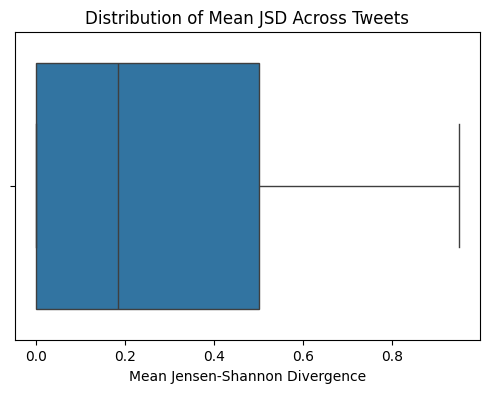

In [77]:
plt.figure(figsize=(6, 4))
sns.boxplot(data=divergence_df, x='mean_jsd')
plt.title("Distribution of Mean JSD Across Tweets")
plt.xlabel("Mean Jensen-Shannon Divergence")
plt.show()


In [86]:
low_jsd_images = tweets_df[tweets_df['jsd_image'] < 0.3]

In [87]:
low_jsd_images.reset_index(drop=True, inplace=True)

1097805912125902848
Tweet 1: At the start of Planetary Security Conference, [USER] shares his experience on how #ClimateChange and environmental damage fueled and resulted in conlicts in Bangladesh, Sudan and Iraq, before Dutch MFA minister   [USER] takes the floor #PSC19 [URL]
Tweet Distribution: {'fear': 0.2981726891237035, 'disgust': 0.10033476297844976, 'joy': 0.07752321326675204, 'surprise': 0.2191560529504403, 'sadness': 0.26431868384954665, 'anger': 0.04049459783110775}
CLIP Distribution: {'anger': 0.35699558, 'disgust': 0.26662388, 'surprise': 0.15496203, 'joy': 0.09638095, 'sadness': 0.09135859, 'fear': 0.033678923}
--------------------------------------------------
1097910354628280320
Tweet 2: Ending #ViolenceAgainstWomen and #Girls is NOT an isolated issue it interlinks with every facet of society#VAWG⛓️#SustainableDevelopment⛓️#Mental & #PhysicalHealth⛓️#Crime ⛓️#ClimateChange⛓️#EconomicSustainability⛓️#SocialandCultural #Norms⛓️#PopulationGrowth⛓️#HumanTrafficking [URL]
Tw

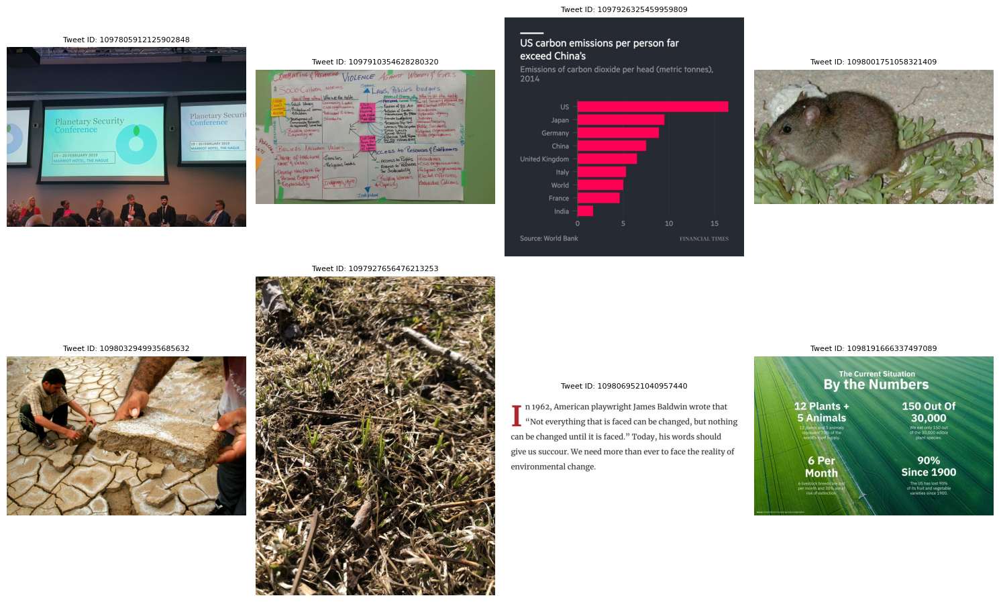

In [89]:
visualize_tweets(low_jsd_images, start_idx=16, end_idx=24)

# High JSD between labels and averge of clip and roberta

In [58]:
high_jsd_mutli = tweets_df[tweets_df['jsd_multi'] > 0.7]

In [59]:
high_jsd_mutli.reset_index(drop=True, inplace=True)


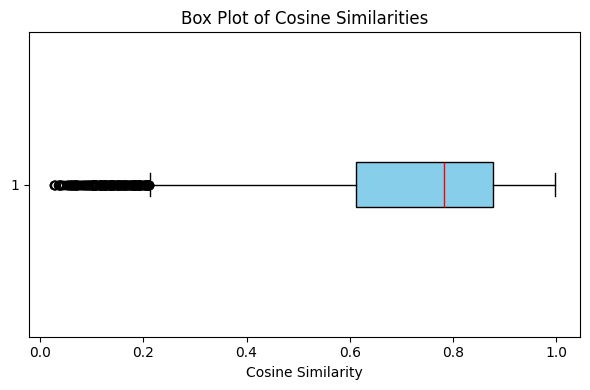

In [64]:
plt.figure(figsize=(6, 4))
plt.boxplot(tweets_df['cosine_similarity_multi'], vert=False, patch_artist=True,
            boxprops=dict(facecolor='skyblue', color='black'),
            medianprops=dict(color='red'))
plt.title('Box Plot of Cosine Similarities')
plt.xlabel('Cosine Similarity')
plt.tight_layout()
plt.show()

In [72]:
high_jsd_replies_df

,id,conversation_id,created_at,replies,tweet_text,tweet_lang,lang_confidence,roberta-large-predictions,mapped_predictions
278,1156847619412516865,1156845060081815552,2019-08-01 08:42:20+00:00,Dede is a dream come true,"Minister of Lands, Agriculture, Water,Climate ...",en,0.854413,"[('joy', 0.993438184261322), ('optimism', 0.94...","[('anger', 0.0020995781886712314), ('fear', 0...."
281,1156848513805950976,1156845060081815552,2019-08-01 08:45:53+00:00,is this the same honorable person that yesterd...,"Minister of Lands, Agriculture, Water,Climate ...",en,0.854413,"[('anger', 0.8467773795127869), ('disgust', 0....","[('anger', 0.40751311635870957), ('fear', 0.01..."
297,1156853299691294720,1156852677080489984,2019-08-01 09:04:54+00:00,why is it that we got a nice bit of weather an...,UK #climatechange indicator 2018: 2018 was the...,en,0.795930,"[('anger', 0.9557802677154541), ('disgust', 0....","[('anger', 0.31071780786018627), ('fear', 0.05..."
313,1156856609701859328,1156852677080489984,2019-08-01 09:18:03+00:00,oh we will not but increasing sunshine is an i...,UK #climatechange indicator 2018: 2018 was the...,en,0.795930,"[('optimism', 0.6479735374450684), ('anticipat...","[('anger', 0.011548423393626045), ('fear', 0.0..."
591,1156928149927714816,1156922246008623104,2019-08-01 14:02:20+00:00,i use public transport,It's now widely known #climatechange is the en...,en,0.886806,"[('sadness', 0.3003625273704529), ('disgust', ...","[('anger', 0.07775364275222364), ('fear', 0.09..."
...,...,...,...,...,...,...,...,...,...
50889,1167857824426123264,1167855361111580673,2019-08-31 17:52:57+00:00,they were not listening then and they are stil...,Worth Another Look: 15 December 2015 UK MP Dav...,en,0.668545,"[('anger', 0.9648580551147461), ('disgust', 0....","[('anger', 0.37458533103598635), ('fear', 0.06..."
50934,1167871656162807808,1167866241211486209,2019-08-31 18:47:55+00:00,But has anyone asked you for an opinion?,"As the [USER] Secretary-General has noted, wh...",en,0.888822,"[('anticipation', 0.6487682461738586), ('sadne...","[('anger', 0.10394969983179918), ('fear', 0.11..."
50959,1167879291394117633,1167866241211486209,2019-08-31 19:18:15+00:00,thank you it was a great honour to sit and tal...,"As the [USER] Secretary-General has noted, wh...",en,0.888822,"[('joy', 0.9937946796417236), ('optimism', 0.9...","[('anger', 0.0020169371840837538), ('fear', 0...."
50964,1167880550939389952,1167877914869690369,2019-08-31 19:23:16+00:00,stick to the good work for charity prefer you ...,We were blessed with perfect Lake District wea...,en,0.913983,"[('optimism', 0.9680694341659546), ('joy', 0.9...","[('anger', 0.0022068750496211523), ('fear', 0...."


In [74]:
filtered_df = high_jsd_replies_df[high_jsd_replies_df['conversation_id'] == 1156845060081815552]

print(filtered_df['tweet_text'].iloc[0])
print(filtered_df[['replies', 'mapped_predictions']].to_string(index=False))

Minister of Lands, Agriculture, Water,Climate and Rural Resettlement  Hon P. Shiri is attending a Green Climate Training Ceremony at Rainbow Towers,Harare.  Green Climate Finance Training is an intiative by private funders and Governments to fight the menace of climate change. [URL]
                                                                                         replies                                                                                                                                                                                        mapped_predictions
                                                                       Dede is a dream come true [('anger', 0.0020995781886712314), ('fear', 0.004812019753507222), ('surprise', 0.053412498880955596), ('disgust', 0.002211924590267632), ('sadness', 0.001636669135592898), ('joy', 0.9358273094510055)]
is this the same honorable person that yesterday called people in parliament monkeys and baboons   [('anger', 0.407513

In [1]:
import os

dir1 = "/work/ptyagi/masterthesis/src/runs/august_exp"
dir2 = "/work/ptyagi/masterthesis/src/runs/february_exp"

files_dir1 = set(os.listdir(dir1))
files_dir2 = set(os.listdir(dir2))

unique_to_dir1 = sorted(files_dir1 - files_dir2)
unique_to_dir2 = sorted(files_dir2 - files_dir1)

print("Files unique to Directory 1:")
for file in unique_to_dir1:
    print(file)
    
print("\nFiles unique to Directory 2:")
for file in unique_to_dir2:
    print(file)

Files unique to Directory 1:

Files unique to Directory 2:


In [2]:
import os
import re
from collections import defaultdict

def find_missing_seeds(dir1, dir2):
    # Compile regex to extract the common part of the filename
    pattern = re.compile(r'(.*)_seed(\d+)_.*')
    
    def get_file_groups(directory):
        groups = defaultdict(set)
        for filename in os.listdir(directory):
            match = pattern.match(filename)
            if match:
                common_part = match.group(1)
                seed = f"seed{match.group(2)}"
                groups[common_part].add(seed)
        return groups
    
    # Get file groups from both directories
    dir1_groups = get_file_groups(dir1)
    dir2_groups = get_file_groups(dir2)
    
    # Combine all keys (common parts) from both directories
    all_keys = set(dir1_groups.keys()).union(set(dir2_groups.keys()))
    
    # Check for missing seeds
    missing_info = []
    for key in all_keys:
        dir1_seeds = dir1_groups.get(key, set())
        dir2_seeds = dir2_groups.get(key, set())
        all_seeds = dir1_seeds.union(dir2_seeds)
        
        # Find missing seeds
        missing_seeds = {'seed7', 'seed42'} - all_seeds
        if missing_seeds:
            missing_info.append((key, missing_seeds))
        elif dir1_seeds != dir2_seeds:
            # If both seeds are present but in different directories
            missing_info.append((key, f"Different seeds in directories: Dir1 - {dir1_seeds}, Dir2 - {dir2_seeds}"))
    
    return missing_info

# Example usage
dir1 = "/work/ptyagi/masterthesis/src/runs/august_exp"
dir2 = "/work/ptyagi/masterthesis/src/runs/february_exp"
missing_files = find_missing_seeds(dir1, dir2)

for key, info in missing_files:
    print(f"File group: {key}, Missing/Issue: {info}")


In [3]:
def filter_missing_files(missing_files, search_string):
    filtered_files = [
        (key, info) for key, info in missing_files if search_string in key
    ]
    return filtered_files

# Example usage
search_string = "only_clip"
filtered_results = filter_missing_files(missing_files, search_string)

for key, info in filtered_results:
    print(f"File group: {key}, Missing/Issue: {info}")


In [1]:
import os
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
import pandas as pd

def extract_metrics_from_logs(base_dir):
    data = []

    # Traverse datasets
    for dataset in os.listdir(base_dir):
        dataset_path = os.path.join(base_dir, dataset)
        if not os.path.isdir(dataset_path):
            continue

        # Traverse experiments for the dataset
        for experiment_dir in os.listdir(dataset_path):
            experiment_path = os.path.join(dataset_path, experiment_dir)
            if not os.path.isdir(experiment_path):
                continue

            # Extract seed from directory name
            seed = None
            for part in experiment_dir.split("_"):
                if part.startswith("seed"):
                    seed = int(part[4:])
                    break

            # Load TensorBoard logs
            event_acc = EventAccumulator(experiment_path)
            event_acc.Reload()

            # Extract scalar metrics
            for tag in event_acc.Tags()["scalars"]:
                events = event_acc.Scalars(tag)
                for event in events:
                    data.append({
                        "dataset": dataset,
                        "experiment": experiment_dir.replace(f"_seed{seed}", ""),
                        "seed": seed,
                        "tag": tag,
                        "step": event.step,
                        "value": event.value
                    })

    return pd.DataFrame(data)



In [2]:
# Specify the base directory for logs
base_dir = "/work/ptyagi/masterthesis/src/runs"

# Extract all metrics
metrics_df = extract_metrics_from_logs(base_dir)


2025-01-29 16:24:52.347729: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738164292.361583  570081 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738164292.367145  570081 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-29 16:24:52.388007: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
metrics_df.to_csv('/work/ptyagi/masterthesis/data/metrics.csv', index=False)

In [4]:
metrics_df.head(10)

,dataset,experiment,seed,tag,step,value
0,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Test/KL_Div,0,0.348614
1,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Test/Cosine_Sim,0,0.807633
2,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Test/MSE,0,0.022959
3,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Loss/Train,0,0.356336
4,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Loss/Train,1,0.341682
5,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Loss/Val_KL_Div,0,0.349530
6,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Loss/Val_KL_Div,1,0.348097
7,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Metrics/Val_Cosine_Sim,0,0.809091
8,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Metrics/Val_Cosine_Sim,1,0.808081
9,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs2_froz...,7.0,Metrics/Val_MSE,0,0.023072


In [18]:
metrics_of_interest = ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]
filtered_df = metrics_df[metrics_df["tag"].isin(metrics_of_interest)]

# Calculate average for each seed and metric
seed_avg = filtered_df.groupby(["dataset", "experiment", "seed", "tag"]).agg({"value": "mean"}).reset_index()

# Pivot to have each metric as a column
pivoted = seed_avg.pivot_table(index=["dataset", "experiment", "seed"], columns="tag", values="value").reset_index()

# Normalize metrics for ranking
for col in ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]:
    if col in pivoted:
        if col == "Test/Cosine_Sim":
            pivoted[f"{col}_norm"] = pivoted[col]  # Higher is better
        else:
            pivoted[f"{col}_norm"] = -pivoted[col]  # Lower is better

# Calculate an aggregate score for ranking
pivoted["score"] = (
    pivoted.get("Test/Cosine_Sim_norm", 0) +
    pivoted.get("Test/MSE_norm", 0) +
    pivoted.get("Test/KL_Div_norm", 0)
)

# Rank experiments by score
pivoted.sort_values(by="score", ascending=False, inplace=True)

# Display results
top_experiments = pivoted[["dataset", "experiment", "seed", "Test/Cosine_Sim", "Test/MSE", "Test/KL_Div", "score"]]
top_experiments.head(10)

tag,dataset,experiment,seed,Test/Cosine_Sim,Test/MSE,Test/KL_Div,score
562,august_exp,exp_roberta_base_lr5e-06_drop0.5_epochs2,42.0,0.831145,0.021708,0.325039,0.484398
432,august_exp,exp_adamw_roberta_large_lr5e-06_drop0.5_gelu_e...,42.0,0.831271,0.021628,0.325571,0.484072
506,august_exp,exp_only_roberta_large_lr5e-06_drop0.3_epochs2,42.0,0.828149,0.021552,0.323418,0.483180
626,august_exp,exp_roberta_large_lr5e-06_drop0.5_epochs2,42.0,0.828677,0.021562,0.324115,0.483000
145,august_exp,exp_adamw_roberta_base_lr5e-06_drop0.3_epochs2,42.0,0.830217,0.021767,0.325486,0.482965
340,august_exp,exp_adamw_roberta_large_lr5e-05_drop0.5_hierar...,42.0,0.830086,0.021789,0.325438,0.482859
193,august_exp,exp_adamw_roberta_base_lr5e-06_drop0.5_epochs2,42.0,0.830524,0.021795,0.325990,0.482738
588,august_exp,exp_roberta_large_lr1e-05_drop0.3_epochs5_both...,42.0,0.830763,0.021774,0.326529,0.482459
251,august_exp,exp_adamw_roberta_large_lr1e-05_drop0.3_epochs...,42.0,0.830723,0.021778,0.326588,0.482357
358,august_exp,exp_adamw_roberta_large_lr5e-06_drop0.3_bigger...,42.0,0.829691,0.021632,0.325791,0.482268


In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("/work/ptyagi/masterthesis/data/metrics.csv")

/var/folders/yp/dcvlqkwd0jgdyxjp_q1f8w440000gn/T/ipykernel_17767/551898342.py:22: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  sns.boxplot(data=df_filtered, x="dataset", y="value", hue="tag", palette=custom_palette)


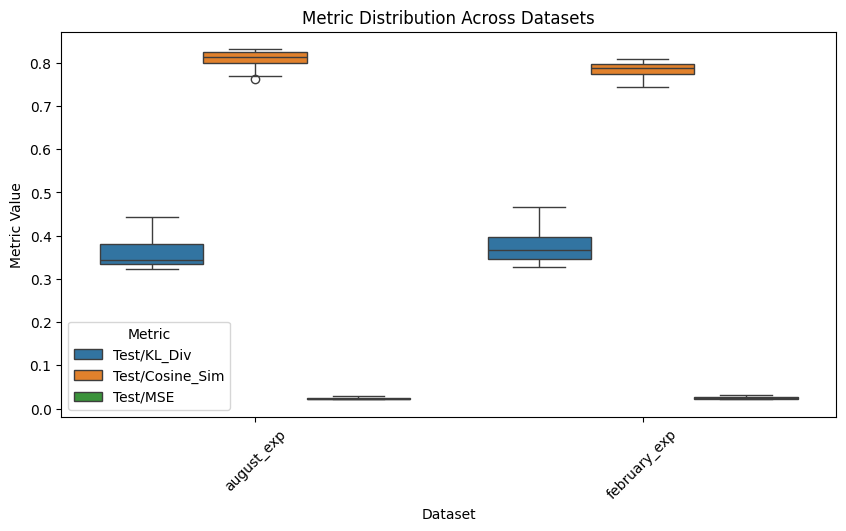

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# Define a custom color palette
custom_palette = sns.color_palette("tab10")  # Try "Set1", "coolwarm", "viridis", etc.

selected_metrics = ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]

df_filtered = df[df["tag"].isin(selected_metrics)]

grouped = df_filtered.groupby(["dataset", "seed", "tag"]).agg({"value": ["mean", "std"]}).reset_index()

best_cosine_sim = df_filtered[df_filtered["tag"] == "Test/Cosine_Sim"].sort_values("value", ascending=False)

best_mse = df_filtered[df_filtered["tag"] == "Test/MSE"].sort_values("value", ascending=True)

best_kl_div = df_filtered[df_filtered["tag"] == "Test/KL_Div"].sort_values("value", ascending=True)

# Boxplot with custom colors
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_filtered, x="dataset", y="value", hue="tag", palette=custom_palette)
plt.title("Metric Distribution Across Datasets")
plt.ylabel("Metric Value")
plt.xlabel("Dataset")
plt.xticks(rotation=45)
plt.legend(title="Metric")
plt.show()


In [26]:
# T-tests for different datasets
for metric in selected_metrics:
    august_values = df_filtered[(df_filtered["dataset"] == "august_exp") & (df_filtered["tag"] == metric)]["value"]
    feb_values = df_filtered[(df_filtered["dataset"] == "february_exp") & (df_filtered["tag"] == metric)]["value"]
    if len(august_values) > 1 and len(feb_values) > 1:
        t_stat, p_val = ttest_ind(august_values, feb_values, equal_var=False)
        print(f"T-test ({metric}) comparing August vs. February datasets: t-stat={t_stat:.4f}, p-val={p_val:.4f}")


T-test (Test/Cosine_Sim) comparing August vs. February datasets: t-stat=34.5215, p-val=0.0000
T-test (Test/MSE) comparing August vs. February datasets: t-stat=-12.4932, p-val=0.0000
T-test (Test/KL_Div) comparing August vs. February datasets: t-stat=-10.3974, p-val=0.0000


In [20]:
# T-tests for different seeds
for metric in selected_metrics:
    seed_7_values = df_filtered[(df_filtered["seed"] == 7) & (df_filtered["tag"] == metric)]["value"]
    seed_42_values = df_filtered[(df_filtered["seed"] == 42) & (df_filtered["tag"] == metric)]["value"]
    if len(seed_7_values) > 1 and len(seed_42_values) > 1:
        t_stat_seed, p_val_seed = ttest_ind(seed_7_values, seed_42_values, equal_var=False)
        print(f"T-test ({metric}) comparing Seed 7 vs. Seed 42: t-stat={t_stat_seed:.4f}, p-val={p_val_seed:.4f}")

T-test (Test/Cosine_Sim) comparing Seed 7 vs. Seed 42: t-stat=-5.9970, p-val=0.0000
T-test (Test/MSE) comparing Seed 7 vs. Seed 42: t-stat=3.4461, p-val=0.0006
T-test (Test/KL_Div) comparing Seed 7 vs. Seed 42: t-stat=6.9527, p-val=0.0000


/var/folders/yp/dcvlqkwd0jgdyxjp_q1f8w440000gn/T/ipykernel_17767/174458124.py:10: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.boxplot(data=filtered_df[filtered_df['tag'] == metric], x="dataset", y="value", hue="seed", palette=custom_palette)


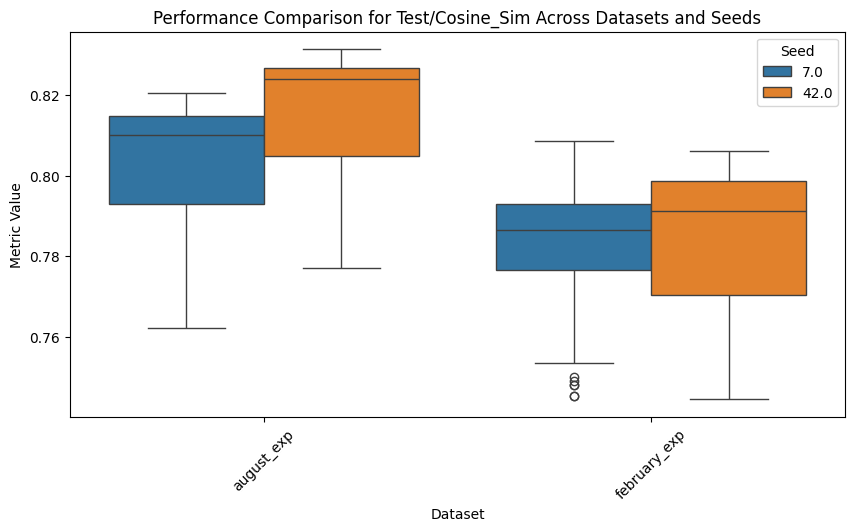

/var/folders/yp/dcvlqkwd0jgdyxjp_q1f8w440000gn/T/ipykernel_17767/174458124.py:10: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.boxplot(data=filtered_df[filtered_df['tag'] == metric], x="dataset", y="value", hue="seed", palette=custom_palette)


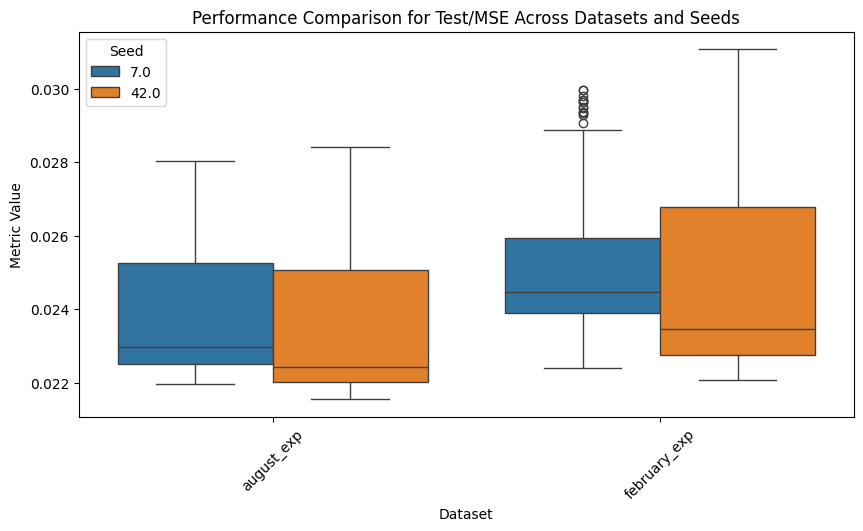

/var/folders/yp/dcvlqkwd0jgdyxjp_q1f8w440000gn/T/ipykernel_17767/174458124.py:10: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.boxplot(data=filtered_df[filtered_df['tag'] == metric], x="dataset", y="value", hue="seed", palette=custom_palette)


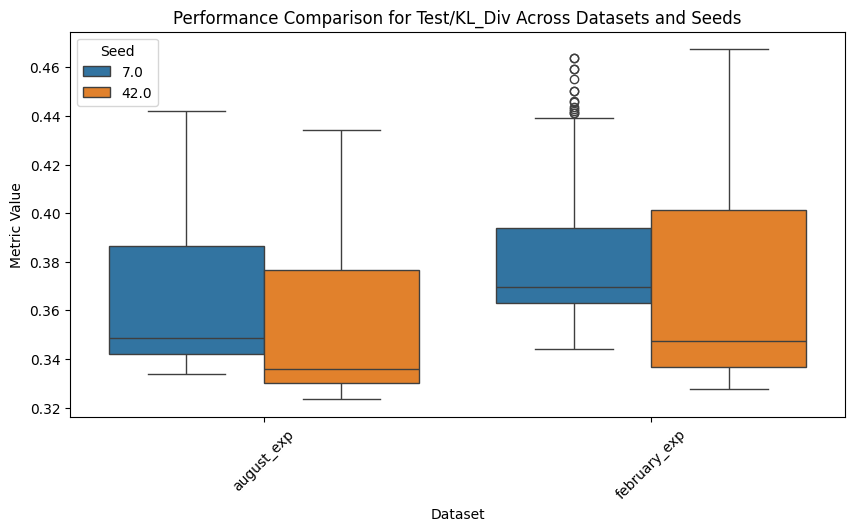

In [34]:
# Define the performance metrics of interest
performance_tags = ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]

# Filter for only relevant metrics
filtered_df = df[df['tag'].isin(performance_tags)]

# Plot performance variation for each metric
for metric in performance_tags:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=filtered_df[filtered_df['tag'] == metric], x="dataset", y="value", hue="seed", palette=custom_palette)
    plt.title(f"Performance Comparison for {metric} Across Datasets and Seeds")
    plt.ylabel("Metric Value")
    plt.xlabel("Dataset")
    plt.xticks(rotation=45)
    plt.legend(title="Seed")
    plt.show()


In [23]:
experiment_seed_counts = df.groupby("experiment")["seed"].nunique()

# Filter out experiments that have only one unique seed
valid_experiments = experiment_seed_counts[experiment_seed_counts > 1].index
df_filtered = df[df["experiment"].isin(valid_experiments)]

# Filter only the relevant test metrics
test_metrics = ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]
df_filtered = df_filtered[df_filtered["tag"].isin(test_metrics)]

# Aggregate per experiment (ignoring dataset & seed)
agg_df = df_filtered.groupby(["experiment", "tag"])["value"].mean().unstack()

# Normalize the metrics
agg_df["Test/Cosine_Sim_Norm"] = agg_df["Test/Cosine_Sim"]
agg_df["Test/MSE_Norm"] = 1 - agg_df["Test/MSE"]
agg_df["Test/KL_Div_Norm"] = 1 - agg_df["Test/KL_Div"]

# Compute final ranking score
agg_df["score"] = agg_df[["Test/Cosine_Sim_Norm", "Test/MSE_Norm", "Test/KL_Div_Norm"]].sum(axis=1)

# Rank experiments
ranked_df = agg_df.sort_values("score", ascending=False).reset_index()

In [25]:
ranked_df["experiment"].tolist()[:20]

['exp_adamw_roberta_large_lr1e-05_drop0.5_bigger_mlp_epochs5_both_frozen',
 'exp_adamw_roberta_base_lr5e-06_drop0.3_gelu_epochs2',
 'exp_adamw_roberta_large_lr1e-05_drop0.5_gelu_epochs5_both_frozen',
 'exp_adamw_roberta_base_lr5e-06_drop0.5_epochs2_frozen_clip',
 'exp_adamw_roberta_large_lr1e-05_drop0.3_gelu_epochs5_both_frozen',
 'exp_adamw_roberta_base_lr1e-05_drop0.3_epochs2_frozen_clip',
 'exp_adamw_roberta_base_lr5e-06_drop0.3_epochs2',
 'exp_adamw_roberta_base_lr5e-06_drop0.5_gelu_epochs2',
 'exp_adamw_roberta_large_lr1e-05_drop0.3_bigger_mlp_epochs5_both_frozen',
 'exp_adamw_roberta_base_lr1e-05_drop0.3_bigger_mlp_epochs2',
 'exp_adamw_roberta_large_lr5e-06_drop0.5_epochs2_frozen_clip',
 'exp_adamw_roberta_base_lr5e-06_drop0.5_bigger_mlp_epochs2',
 'exp_adamw_roberta_large_lr1e-05_drop0.3_epochs5_both_frozen',
 'exp_adamw_roberta_base_lr1e-05_drop0.5_epochs2_frozen_clip',
 'exp_adamw_roberta_large_lr5e-05_drop0.3_hierarchical_epochs2_frozen_clip',
 'exp_adamw_roberta_base_lr5e-0

In [26]:
ranked_df[ranked_df["experiment"].str.contains("only_clip", case=False, na=False)].head()

tag,experiment,Test/Cosine_Sim,Test/KL_Div,Test/MSE,Test/Cosine_Sim_Norm,Test/MSE_Norm,Test/KL_Div_Norm,score
177,exp_only_clip_lr5e-06_drop0.5_epochs2,0.799633,0.358341,0.023875,0.799633,0.976125,0.641659,2.417416
178,exp_adamw_only_clip_lr5e-06_drop0.3_epochs2,0.799298,0.358008,0.023882,0.799298,0.976118,0.641992,2.417408
179,exp_only_clip_lr1e-05_drop0.3_epochs10_frozen,0.799677,0.358458,0.023895,0.799677,0.976105,0.641542,2.417324
181,exp_only_clip_lr5e-06_drop0.3_epochs2,0.799004,0.359140,0.024006,0.799004,0.975994,0.640860,2.415859
185,exp_adamw_only_clip_lr5e-06_drop0.5_epochs2,0.797747,0.361211,0.024105,0.797747,0.975895,0.638789,2.412432


In [28]:
ranked_df[ranked_df["experiment"].str.contains("only_roberta", case=False, na=False)]["experiment"].tolist()[:10]

['exp_only_roberta_large_lr1e-05_drop0.3_epochs10_frozen',
 'exp_only_roberta_large_lr5e-06_drop0.3_epochs2',
 'exp_only_roberta_large_lr5e-06_drop0.3_epochs10_frozen',
 'exp_only_roberta_large_lr1e-05_drop0.3_epochs5_frozen',
 'exp_only_roberta_large_lr5e-06_drop0.3_epochs5_frozen',
 'exp_only_roberta_large_lr1e-05_drop0.3_epochs2_frozen',
 'exp_only_roberta_large_lr1e-05_drop0.3_epochs2',
 'exp_only_roberta_large_lr5e-06_drop0.3_epochs2_frozen',
 'exp_only_roberta_large_lr5e-06_drop0.3_epochs5',
 'exp_only_roberta_large_lr1e-05_drop0.3_epochs5']

In [ ]:
#exp_adamw_roberta_base_lr5e-06_drop0.3_epochs2
#exp_adamw_only_clip_lr5e-06_drop0.3_epochs2
#exp_only_roberta_base_lr1e-05_drop0.3_epochs2

In [39]:
# Filter only the relevant test metrics
test_metrics = ["Test/Cosine_Sim", "Test/MSE", "Test/KL_Div"]
df_filtered = df[df["tag"].isin(test_metrics)]

# Aggregate per experiment (ignoring dataset & seed)
agg_df = df_filtered.groupby(["experiment", "dataset", "seed", "tag"])["value"].mean().unstack()

# Normalize the metrics
agg_df["Test/Cosine_Sim_Norm"] = agg_df["Test/Cosine_Sim"] / agg_df["Test/Cosine_Sim"].max()
agg_df["Test/MSE_Norm"] = 1 - (agg_df["Test/MSE"] / agg_df["Test/MSE"].max())  # Inverse for ranking
agg_df["Test/KL_Div_Norm"] = 1 - (agg_df["Test/KL_Div"] / agg_df["Test/KL_Div"].max())  # Inverse for ranking

# Compute final ranking score
agg_df["score"] = agg_df[["Test/Cosine_Sim_Norm", "Test/MSE_Norm", "Test/KL_Div_Norm"]].mean(axis=1)

# Rank experiments
ranked_df = agg_df.sort_values("score", ascending=False).reset_index()


In [40]:
ranked_df

tag,experiment,dataset,seed,Test/Cosine_Sim,Test/KL_Div,Test/MSE,Test/Cosine_Sim_Norm,Test/MSE_Norm,Test/KL_Div_Norm,score
0,exp_only_roberta_large_lr5e-06_drop0.3_epochs2,august_exp,42.0,0.828149,0.323418,0.021552,0.996245,0.306476,0.308130,0.536950
1,exp_roberta_large_lr5e-06_drop0.5_epochs2,august_exp,42.0,0.828677,0.324115,0.021562,0.996880,0.306145,0.306639,0.536555
2,exp_adamw_roberta_large_lr5e-06_drop0.5_gelu_e...,august_exp,42.0,0.831271,0.325571,0.021628,1.000000,0.304023,0.303523,0.535849
3,exp_roberta_large_lr5e-06_drop0.5_epochs2_froz...,august_exp,42.0,0.828292,0.324753,0.021608,0.996417,0.304657,0.305273,0.535449
4,exp_roberta_base_lr5e-06_drop0.5_epochs2,august_exp,42.0,0.831145,0.325039,0.021708,0.999849,0.301449,0.304661,0.535320
...,...,...,...,...,...,...,...,...,...,...
1276,exp_adamw_roberta_large_lr1e-05_drop0.3_gelu_e...,february_exp,42.0,0.744985,0.462847,0.030329,0.896200,0.024037,0.009857,0.310031
1277,exp_roberta_large_lr1e-05_drop0.5_epochs5_froz...,february_exp,42.0,0.745960,0.463935,0.030468,0.897373,0.019557,0.007529,0.308153
1278,exp_only_roberta_large_lr1e-05_drop0.3_epochs10,february_exp,42.0,0.744633,0.466915,0.030484,0.895777,0.019033,0.001155,0.305321
1279,exp_roberta_large_lr1e-05_drop0.3_epochs5_froz...,february_exp,42.0,0.748443,0.467148,0.030664,0.900361,0.013229,0.000655,0.304748


/var/folders/yp/dcvlqkwd0jgdyxjp_q1f8w440000gn/T/ipykernel_17767/1275309568.py:2: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.boxplot(data=ranked_df, x="dataset", y="score", hue="seed", palette=custom_palette)


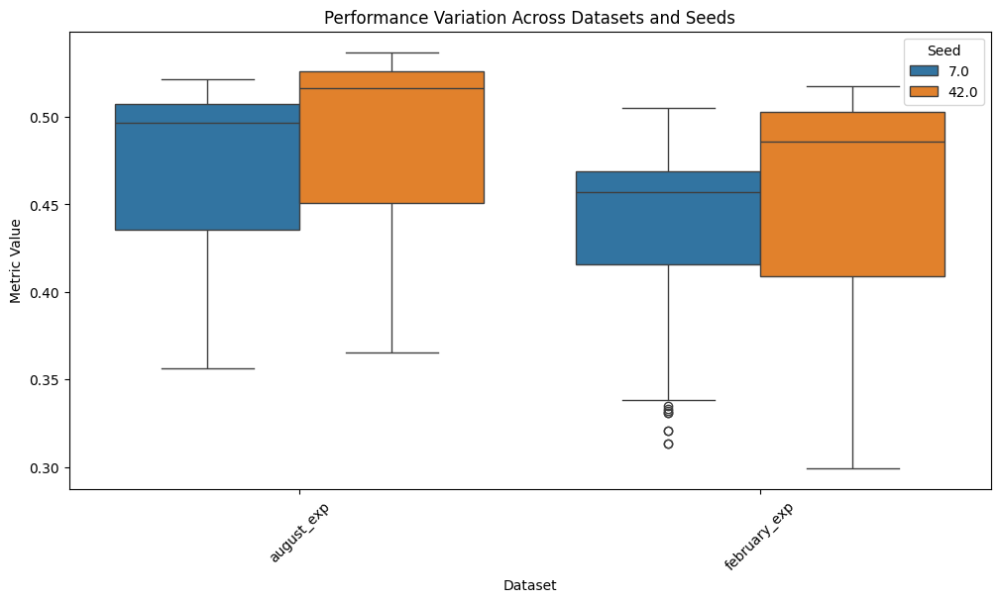

In [44]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=ranked_df, x="dataset", y="score", hue="seed", palette=custom_palette)
plt.title("Performance Variation Across Datasets and Seeds")
plt.ylabel("Metric Value")
plt.xlabel("Dataset")
plt.xticks(rotation=45)
plt.legend(title="Seed")
plt.show()
